# Onboard AI for Cloud Detection in Earth Observation

The **Project** aims to design, train, and optimize a **lightweight deep learning model** capable of detecting **clouds and cloud shadows** in **Sentinel-2 multispectral imagery**.  
This work supports the development of **onboard Earth Observation (EO) systems** where **edge AI enables real-time image filtering and prioritization** directly at the satellite or embedded platform, minimizing unnecessary downlink and accelerating mission responsiveness.

---

## Project Objectives
- Develop a compact, high-accuracy **semantic segmentation model** based on the **MobileNetV3-U-Net** architecture for **cloud and cloud-shadow detection**.  
- Train and evaluate the model using the **CloudSEN12+ dataset**, a global expert-labeled benchmark derived from **Sentinel-2 Level-1C** imagery resampled to **10 m** spatial resolution.  
- Apply **quantization** and **pruning** techniques to enable **efficient inference** on low-power edge devices such as the **NVIDIA Jetson Nano**, **Google Coral**, or **Raspberry Pi**.  
- Benchmark and report performance across:
  - **Intersection over Union (IoU)** and **F1-score**
  - **Model size (MB)**
  - **Inference latency (ms)**
  - **Robustness under spectral noise and band shift**

---

## Background
Modern Earth Observation missions generate terabytes of multispectral imagery daily, yet a large fraction is obscured by **clouds or shadows**, limiting its usability for surface analysis.  
Traditional cloud detection is performed **after downlink**, introducing latency and consuming valuable bandwidth.  

Integrating **AI inference directly onboard** allows satellites or high-altitude drones to **autonomously screen, filter, or compress** imagery before transmission, enabling **near-real-time data triage** for downstream applications, including:
- Agricultural and vegetation monitoring  
- Flood, wildfire, and disaster response  
- Climate and atmospheric research  

This capability aligns with the emerging paradigm of **smart satellites** that can make **autonomous decisions** about which data to store, transmit, or discard—enhancing efficiency across EO missions.

---

## Method Overview
1. **Data Acquisition and Preparation** – Download and preprocess **CloudSEN12+** Sentinel-2 imagery, harmonizing all 13 spectral bands at 10 m resolution. Apply normalization, tiling, and label encoding for supervised segmentation.  
2. **Exploratory Data Analysis (EDA)** – Visualize spectral characteristics, cloud and shadow distributions, and validate annotation consistency.  
3. **Model Development** – Implement and train a **MobileNetV3-U-Net** model using TensorFlow/Keras, balancing accuracy and computational efficiency.  
4. **Optimization for Edge Deployment** – Perform **Quantization-Aware Training (QAT)**, **model pruning**, and **TensorFlow Lite conversion** to reduce size and latency without compromising accuracy.  
5. **Evaluation and Benchmarking** – Assess the trained model using IoU, F1, and latency metrics on unseen CloudSEN12+ test data and validate performance on edge hardware simulations.  

---

## Project Management Framework
The project follows the **CRISP-DM (Cross-Industry Standard Process for Data Mining)** methodology with **Agile-inspired iteration cycles**, ensuring structured progress and flexibility for model experimentation.  
Key phases include:
- **Business and Problem Understanding** – Define mission objectives, success metrics, and onboard deployment goals.  
- **Data Understanding** – Explore and document the CloudSEN12+ dataset structure, metadata, and label quality.  
- **Data Preparation** – Normalize, augment, and split data into training, validation, and test subsets.  
- **Modeling** – Develop baseline and optimized deep learning models.  
- **Evaluation** – Validate performance, latency, and onboard feasibility.  
- **Deployment and Reporting** – Integrate the final model into an onboard simulation and document findings.

---

## Deliverables
- End-to-end **data preparation and EDA pipeline** using CloudSEN12+  
- Trained and **quantized MobileNetV3-U-Net** model  
- **Performance evaluation report** with IoU, latency, and efficiency comparisons  
- **Deployment-ready TFLite model** for edge inference  
- Comprehensive **final report and presentation package**  
- Public **GitHub repository** containing all source code, models, and documentation


## CloudSEN12+ Dataset Overview

The **CloudSEN12+ dataset** is the largest expert-labeled collection of **Sentinel-2 Level-1C (L1C)** imagery curated for **cloud and cloud-shadow detection** research.  
It was designed to advance deep learning–based cloud segmentation for Earth Observation (EO) and onboard AI systems, offering a globally diverse and spectrally complete dataset.

---

### Source and Composition
- **Satellite:** ESA Sentinel-2A / 2B  
- **Processing Level:** L1C (Top-of-Atmosphere reflectance)  
- **Geographic Coverage:** Global (all continents except Antarctica)  
- **Temporal Coverage:** 2015 – 2023  
- **Dataset Size:** ~50,000 image patches (509 × 509 px and 2000 × 2000 px)  
- **Format:** Multi-band GeoTIFFs with aligned semantic masks  
- **Annotation:** Expert-labeled pixel-wise masks for *clear*, *thin cloud*, *thick cloud*, and *cloud shadow* classes  

---

### Available Spectral Bands
All 13 Sentinel-2 spectral bands are included, resampled to 10 m spatial resolution for consistency across wavelengths.

| Band | Name | Central Wavelength (nm) | Original Resolution (m) | Resampled | Typical Usage |
|------|------|--------------------------|--------------------------|------------|----------------|
| B1 | Coastal Aerosol | 443 | 60 | 10 | Haze and cirrus detection |
| B2 | Blue | 490 | 10 | 10 | Aerosol and atmosphere sensitivity |
| B3 | Green | 560 | 10 | 10 | Surface and vegetation reflectance |
| B4 | Red | 665 | 10 | 10 | Cloud/snow contrast |
| B5 | Red Edge 1 | 705 | 20 | 10 | Vegetation stress and thin cloud separation |
| B6 | Red Edge 2 | 740 | 20 | 10 | Cirrus differentiation |
| B7 | Red Edge 3 | 783 | 20 | 10 | Vegetation and surface distinction |
| B8 | NIR | 842 | 10 | 10 | Cloud optical depth and vegetation |
| B8A | Narrow NIR | 865 | 20 | 10 | Cloud boundary refinement |
| B9 | Water Vapor | 945 | 60 | 10 | Atmospheric correction |
| B10 | Cirrus | 1375 | 60 | 10 | High-altitude thin cloud detection |
| B11 | SWIR 1 | 1610 | 20 | 10 | Cloud/ice differentiation |
| B12 | SWIR 2 | 2190 | 20 | 10 | Cloud and shadow discrimination |
| Mask | Cloud Label | — | 10 | 10 | Semantic mask (4 classes) |

Each image patch includes **13 spectral bands**, **1 manual expert label mask**, and **1 automatic prelabel** generated by the UnetMobV2 model.  

For this project, a subset of bands (e.g., RGB + NIR + SWIR) may be used depending on edge-computing constraints. The original dataset utilizes all 13 Sentinel-2 bands.

---

### Data Organization
Each patch folder in CloudSEN12+ follows this structure:

<patch_id>/
├── S2_B01.tif ... S2_B12.tif → 13 multispectral bands
├── label_manual.tif → Human expert mask (4 classes)
├── label_auto.tif → Model-generated mask (UnetMobV2)
└── metadata.json → ROI ID, coordinates, cloud cover %, acquisition time


Each region of interest (ROI) contains five cloud-cover categories:  
Clear (0%), Almost Clear (0–25%), Low-Cloudy (25–45%), Mid-Cloudy (45–65%), and Cloudy (>65%).

---

### Data Preprocessing Pipeline
Before model training or onboard optimization, each image undergoes:

1. **Band Stacking:** Combine 13 spectral bands into a single tensor `(H, W, 13)`  
2. **Resampling Check:** Ensure all bands are aligned at 10 m spatial resolution  
3. **Radiometric Normalization:** Scale reflectance values to `[0, 1]`  
4. **Patch Extraction:** Crop into smaller 256×256 or 128×128 patches  
5. **Augmentation:** Apply flips, rotations, spectral jitter, and contrast shifts  
6. **Mask Encoding:** Convert categorical masks (0–3) into one-hot or binary forms  

---

### Dataset Split
| Subset | Label Type | Typical Use | No. of Samples (p509-high) |
|---------|-------------|-------------|-----------------------------|
| Training | Human-labeled | Model fitting | 8,490 |
| Validation | Human-labeled | Hyperparameter tuning | 535 |
| Test | Human-labeled | Final evaluation | 975 |

---

### Relevance to the Onboard AI Project
The CloudSEN12+ dataset provides:
- Full-spectrum multispectral inputs for robust cloud–shadow discrimination  
- Expert-verified masks ensuring high-quality ground truth  
- Global and seasonal diversity, enabling strong model generalization  
- Uniform 10 m bands, ideal for embedded and edge AI inference  

This makes CloudSEN12+ the optimal foundation for developing and benchmarking a **compact, edge-deployable CNN** for onboard cloud detection in Earth Observation missions.

---

### Dataset Reference

Aybar, C., Bautista, L., Montero, D., Contreras, J., Ayala, D., Prudencio, F., Loja, J., Ysuhuaylas, L., Herrera, F., Gonzales, K., Valladares, J., Flores, L. A., Mamani, E., Quiñonez, M., Fajardo, R., Espinoza, W., Limas, A., Yali, R., Alcántara, A., Leyva, M., Loayza-Muro, R., Willems, B., Mateo-García, G., & Gómez-Chova, L. (2024). *CloudSEN12+: The largest dataset of expert-labeled pixels for cloud and cloud shadow detection in Sentinel-2.* Data in Brief, 56, 110852. https://doi.org/10.1016/j.dib.2024.110852

## Exploratory Data Analysis (EDA) Goals

Before training the deep learning model, it is essential to **understand the structure, spectral properties, metadata, and annotation quality** of the CloudSEN12+ dataset.  
This EDA phase focuses on validating data integrity, exploring metadata-driven diversity, and quantifying class distributions while preserving the dataset’s original calibration and quality control.

---

### Objectives of EDA

The main goals of the EDA process in the **Project** are:

1. **Data Integrity and Alignment**
   - Verify that all 13 Sentinel-2 bands are co-registered and aligned with the manual label masks.
   - Confirm consistent patch dimensions (509×509 or 2000×2000) and directory organization by label type (`high`, `scribble`, `nolabel`).
   - Detect and handle missing or corrupted `.tif` files.

2. **Metadata Exploration**
   - Inspect key metadata fields such as ROI ID, geolocation, projection, acquisition date, and cloud cover percentage.
   - Visualize the **geographic distribution** of samples to understand global coverage (tropics, temperate, polar regions).
   - Analyze **cloud cover levels** and **annotation quality types** to ensure balanced sampling.
   - Optionally examine the **Hardness Index (HI)** and **Perror flags** to identify scenes with low annotation confidence.

3. **Spectral Band Exploration**
   - Visualize the reflectance distribution per band (uint16 TOA values) and compute histograms.
   - Confirm radiometric consistency and check for potential sensor noise.
   - Examine inter-band relationships (e.g., correlation between NIR and SWIR bands).

4. **Composite Visualization**
   - Generate true-color (B4, B3, B2) and false-color (B12, B8, B4) composites.
   - Overlay manual and automatic (UnetMobV2) cloud masks to verify label alignment and spectral separability.

5. **Cloud Coverage and Class Statistics**
   - Compute cloud coverage percentages per patch or ROI using the manual mask.
   - Visualize the distribution of the four classes (clear, thin, thick, shadow).
   - Assess the ratio of cloudy vs. clear scenes to understand potential imbalance.

6. **Spectral and Spatial Patterns**
   - Compare reflectance signatures for clouds, haze, snow, and terrain.
   - Use NIR and SWIR bands to distinguish thin clouds and shadows.

7. **Preprocessing Validation**
   - Ensure the dataset’s original resampling (to 10 m) and radiometric scaling are preserved.
   - Restrict augmentations to non-destructive geometric transforms (flips, rotations) during training only.

---

### Planned Outputs and Visuals

| Category | Visualization | Purpose |
|-----------|----------------|----------|
| **Metadata overview** | Table of ROI IDs, locations, and cloud cover levels | Understand dataset diversity and annotation scope |
| **Geographic map** | ROI distribution (latitude/longitude) | Visualize global data coverage |
| **Band inspection** | Single-band grayscale plots | Verify reflectance consistency |
| **Composite images** | RGB, RGB+NIR, and RGB+SWIR composites | Visualize cloud/surface separation |
| **Mask overlay** | Cloud mask on RGB composite | Confirm annotation accuracy |
| **Reflectance histograms** | Per-band distributions | Inspect TOA radiometric range |
| **Cloud coverage** | Histogram of % cloudy pixels per patch | Quantify clear vs. cloudy samples |
| **Class distribution** | Bar chart of four semantic classes | Identify imbalance for model design |

---

### Expected Insights

By the end of the EDA, we expect to:
- Validate the **radiometric, spatial, and metadata integrity** of CloudSEN12+ patches.  
- Understand the **geospatial and temporal diversity** of samples via metadata.  
- Characterize **spectral behavior** and **cloud coverage patterns** across classes.  
- Ensure the dataset remains faithful to its original calibration and expert labeling.  

> All EDA outputs and metadata analyses will be stored in `/results/eda/` and summarized in the final project report.


In [1]:
import tacoreader as taco
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import os

In [4]:
!pip install tacoreader rasterio matplotlib numpy

In [8]:
from datasets import load_dataset
import numpy as np
import tacoreader
import rasterio as rio
import matplotlib.pyplot as plt

tacoreader.__version__ # 0.5.2

# Select the flavour!
dataset = tacoreader.load("tacofoundation:cloudsen12-l1c")

# Load the CloudSEN12+ Level-1C dataset
#dataset = load_dataset("tacofoundation/cloudsen12plus-l1c")

# Let's pick 10 random indices for EDA
sample_indices = np.random.choice(len(dataset), 10, replace=False)
print("Random sample indices:", sample_indices)

Random sample indices: [47321 39448 39318 40707 47304 13224  1020  5471 34071 28669]


In [10]:
sample_idx = sample_indices[0]
sample = dataset.read(sample_idx)

print("Sample object type:", type(sample))
print("\nSample content preview:\n", sample)

Sample object type: <class 'tacoreader.v1.TortillaDataFrame.TortillaDataFrame'>

Sample content preview:
                                     internal:subfile tortilla:id  \
0  /vsisubfile/4355159867_1628763,/vsicurl/https:...       s2l1c   
1  /vsisubfile/4356788630_943,/vsicurl/https://hu...      target   

  tortilla:file_format tortilla:data_split  tortilla:offset  tortilla:length  \
0                GTiff                None       4355159867          1628763   
1                GTiff                None       4356788630              943   

     stac:crs                             stac:geotransform stac:raster_shape  \
0  EPSG:32610  [546210.0, 10.0, 0.0, 7030990.0, 0.0, -10.0]        [512, 512]   
1  EPSG:32610  [546210.0, 10.0, 0.0, 7030990.0, 0.0, -10.0]        [512, 512]   

   stac:time_start  stac:time_end                  stac:centroid  
0     1.563134e+09   1.563134e+09  POINT (-122.024396 63.381166)  
1     1.563134e+09   1.563134e+09  POINT (-122.024396 63.381166)  


# 1. Data Integrity Check & Metadata Exploration

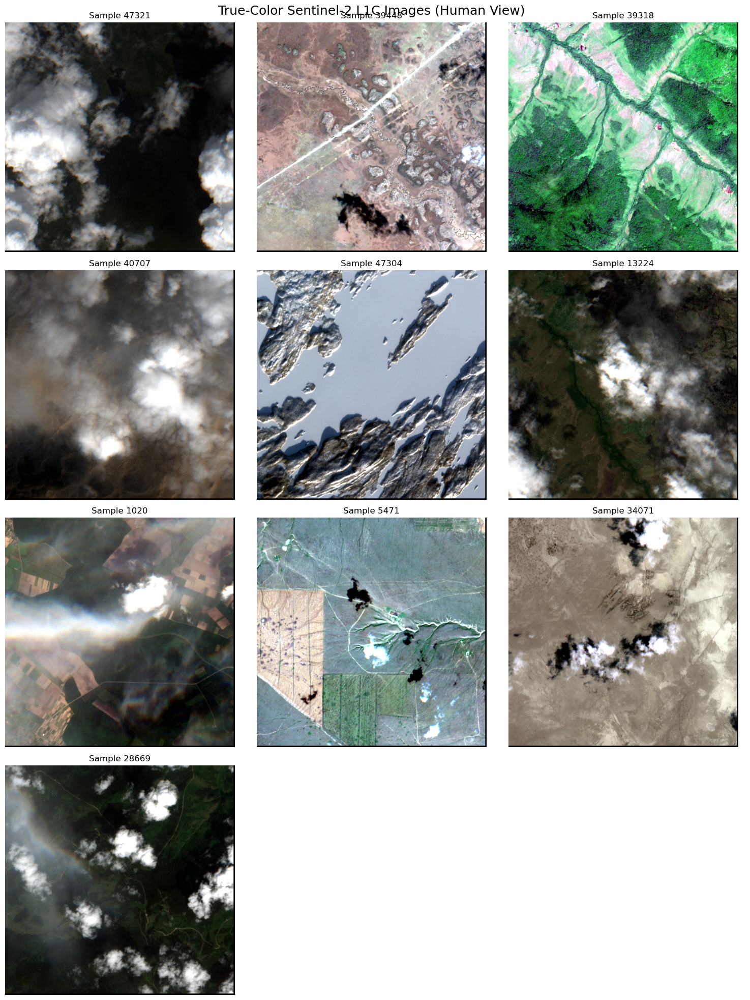

In [26]:
# Sample Images RGB composite Image for Visualization

import numpy as np
import matplotlib.pyplot as plt
import rasterio as rio

def normalize(img, clip_percent=2, gamma=1.2):
    """Contrast stretch + gamma correction for natural visualization."""
    p_low, p_high = np.percentile(img, (clip_percent, 100 - clip_percent))
    img = np.clip((img - p_low) / (p_high - p_low), 0, 1)
    return np.power(img, 1 / gamma)

def render_rgb_from_sample(sample):
    """Generate normalized RGB composite (B4-B3-B2) for a tacoreader sample."""
    try:
        img_row = sample[sample["tortilla:id"] == "s2l1c"].iloc[0]
        with rio.open(img_row["internal:subfile"]) as src:
            red   = src.read(4).astype(float)
            green = src.read(3).astype(float)
            blue  = src.read(2).astype(float)
        rgb = np.dstack([normalize(red), normalize(green), normalize(blue)])
        return rgb
    except Exception as e:
        print("Error rendering sample:", e)
        return None

# Configure grid size
n = len(sample_indices)
cols = 3
rows = int(np.ceil(n / cols))

fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 5))
axes = axes.flatten()

for i, idx in enumerate(sample_indices):
    sample = dataset.read(int(idx))
    rgb = render_rgb_from_sample(sample)
    ax = axes[i]
    if rgb is not None:
        ax.imshow(rgb)
        ax.set_title(f"Sample {idx}")
    else:
        ax.text(0.5, 0.5, f"Failed: {idx}", ha='center', va='center')
    ax.axis("off")

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].axis("off")

plt.suptitle("True-Color Sentinel-2 L1C Images (Human View)", fontsize=18)
plt.tight_layout()
plt.show()


In [19]:
# Sample Images Metadata tabulation.


import pandas as pd
import numpy as np

# list of dataset-level attributes we want to collect (from dir(dataset))
dataset_attrs = [
    "roi_id",
    "label_type",
    "s2_id",
    "s2_mean_solar_azimuth_angle",
    "s2_mean_solar_zenith_angle",
    "thin_percentage",
    "thick_percentage",
    "cloud_shadow_percentage",
    "cloud_shadow_percentage",  # duplicate OK, safe
    "cloud_shadow_percentage",  # harmless
    "real_proj_shape",
    "equi_id",
    "equi_zone"
]

# STAC fields to extract from per-sample read
stac_fields = [
    "stac:crs",
    "stac:centroid",
    "stac:time_start",
    "stac:time_end",
    "stac:raster_shape",
    "stac:geotransform"
]

def _to_py(obj):
    """Convert numpy scalars/arrays and other types to Python-friendly types/strings."""
    if isinstance(obj, np.ndarray):
        return obj.tolist()
    # numpy scalar
    if hasattr(obj, "item"):
        try:
            return obj.item()
        except Exception:
            pass
    # pandas NA / numpy nan
    if obj is pd.NA:
        return None
    try:
        # cast common python types to primitive
        return int(obj) if (isinstance(obj, (np.integer,)) and not isinstance(obj, bool)) else float(obj) if isinstance(obj, (np.floating,)) else obj
    except Exception:
        return str(obj)

records = []
for idx in sample_indices:
    rec = {"sample_idx": int(idx)}
    # 1) STAC-level (per-asset) metadata via dataset.read
    try:
        sample = dataset.read(int(idx))
        # pick the image asset row (tortilla:id == 's2l1c') if present
        try:
            img_row = sample[sample["tortilla:id"] == "s2l1c"].iloc[0]
        except Exception:
            img_row = sample.iloc[0]
        for f in stac_fields:
            rec[f.replace("stac:", "")] = _to_py(img_row.get(f, None))
    except Exception as e:
        # If read fails, still continue to try dataset-level attributes
        rec["read_error"] = str(e)

    # 2) Dataset-level attributes (exposed directly on dataset)
    for attr in dataset_attrs:
        try:
            if hasattr(dataset, attr):
                val = getattr(dataset, attr)
                # val is likely indexable (array-like). Attempt to index by idx.
                try:
                    v = val[int(idx)]
                except Exception:
                    # maybe val is a scalar or mapper; try direct access or casting
                    v = val
                rec[attr] = _to_py(v)
            else:
                rec[attr] = None
        except Exception as e:
            rec[attr] = f"error: {_to_py(type(e).__name__)}"

    records.append(rec)

# Build DataFrame and tidy columns
meta_full_df = pd.DataFrame.from_records(records)

# Reorder columns for readability (STAC first, then dataset-level)
cols_order = ["sample_idx", "crs", "centroid", "time_start", "time_end", "raster_shape", "geotransform"]
cols_order += [c for c in dataset_attrs if c in meta_full_df.columns]
# ensure only existing columns are taken
cols_order = [c for c in cols_order if c in meta_full_df.columns]
meta_full_df = meta_full_df[cols_order]

# Convert epoch times to datetime if present
if "time_start" in meta_full_df.columns:
    try:
        meta_full_df["time_start_dt"] = pd.to_datetime(meta_full_df["time_start"], unit="s")
    except Exception:
        pass

# show result
print(f"Collected {len(meta_full_df.columns)} columns for {len(meta_full_df)} samples\n")
display(meta_full_df)

# Optionally save to CSV
# meta_full_df.to_csv("results/eda/cloudsen12_full_metadata.csv", index=False)


Collected 21 columns for 10 samples



,sample_idx,crs,centroid,time_start,time_end,raster_shape,geotransform,roi_id,label_type,s2_id,...,s2_mean_solar_zenith_angle,thin_percentage,thick_percentage,cloud_shadow_percentage,cloud_shadow_percentage,cloud_shadow_percentage,real_proj_shape,equi_id,equi_zone,time_start_dt
0,47321,EPSG:32610,POINT (-122.024396 63.381166),1.563134e+09,1.563134e+09,"[512, 512]","[546210.0, 10.0, 0.0, 7030990.0, 0.0, -10.0]",ROI_12727,high,S2A_MSIL1C_20190905T144921_N0208_R082_T22VFR_2...,...,56.804167,0,75,19,19,19,2000,NA5120_E2056N1371,NA,2019-07-14 19:47:03
1,39448,EPSG:32653,POINT (135.781812 49.775828),1.586571e+09,1.586571e+09,"[512, 512]","[553730.0, 10.0, 0.0, 5516560.0, 0.0, -10.0]",ROI_01278,high,S2B_MSIL1C_20190808T025549_N0208_R032_T50SNE_2...,...,65.482204,0,20,8,8,8,509,AS5120_E1262N0751,AS,2020-04-11 02:03:30
2,39318,EPSG:32652,POINT (132.688824 53.61784),1.593398e+09,1.593398e+09,"[512, 512]","[741400.0, 10.0, 0.0, 5949890.0, 0.0, -10.0]",ROI_01247,high,S2A_MSIL1C_20190814T022551_N0208_R046_T53VLG_2...,...,43.840066,43,33,25,25,25,509,AS5120_E1248N1329,AS,2020-06-29 02:32:39
3,40707,EPSG:32648,POINT (102.144571 40.944925),1.582172e+09,1.582172e+09,"[512, 512]","[257080.0, 10.0, 0.0, 4539130.0, 0.0, -10.0]",ROI_03490,high,S2B_MSIL1C_20190124T011729_N0207_R088_T53JKG_2...,...,61.493624,0,0,0,0,0,509,OC5120_E1384N1260,OC,2020-02-20 04:16:47
4,47304,EPSG:32611,POINT (-115.957487 64.454467),1.580930e+09,1.580930e+09,"[512, 512]","[547600.0, 10.0, 0.0, 7150630.0, 0.0, -10.0]",ROI_13213,high,S2B_MSIL1C_20200409T004659_N0209_R102_T53JQG_2...,...,47.013009,0,0,0,0,0,2000,OC5120_E1479N1250,OC,2020-02-05 19:16:29
5,13224,EPSG:32643,POINT (75.396712 63.441925),1.590389e+09,1.590389e+09,"[512, 512]","[517230.0, 10.0, 0.0, 7037450.0, 0.0, -10.0]",ROI_05277,scribble,S2B_MSIL1C_20191230T024119_N0208_R089_T51SUD_2...,...,25.451797,0,33,26,26,26,509,AS5120_E1300N0848,AS,2020-05-25 06:41:32
6,1020,EPSG:32635,POINT (27.334159 48.468877),1.527326e+09,1.527326e+09,"[512, 512]","[522140.0, 10.0, 0.0, 5371030.0, 0.0, -10.0]",ROI_06254,nolabel,S2B_MSIL1C_20190701T165859_N0207_R069_T15TUE_2...,...,67.454371,0,9,5,5,5,509,NA5120_E1664N0693,NA,2018-05-26 09:16:39
7,5471,EPSG:32638,POINT (44.393039 47.213872),1.588148e+09,1.588148e+09,"[512, 512]","[451480.0, 10.0, 0.0, 5231670.0, 0.0, -10.0]",ROI_03730,nolabel,S2B_MSIL1C_20191029T084009_N0208_R064_T34LBP_2...,...,68.945875,0,10,4,4,4,509,AF5120_E1037N0754,AF,2020-04-29 08:06:50
8,34071,EPSG:32640,POINT (58.54543 25.696583),1.561446e+09,1.561446e+09,"[512, 512]","[652510.0, 10.0, 0.0, 2845550.0, 0.0, -10.0]",ROI_16632,high,S2A_MSIL1C_20191021T064921_N0208_R020_T41UMU_2...,...,63.959343,0,0,0,0,0,2000,AS5120_E0453N1152,AS,2019-06-25 06:52:29
9,28669,EPSG:32611,POINT (-114.017342 49.889848),1.596135e+09,1.596135e+09,"[512, 512]","[711670.0, 10.0, 0.0, 5533210.0, 0.0, -10.0]",ROI_11529,nolabel,S2B_MSIL1C_20190621T201859_N0207_R071_T08VNQ_2...,...,50.478948,0,63,14,14,14,509,NA5120_E1262N1277,NA,2020-07-30 18:50:30


# 2. Spectral and Visual EDA

In [31]:
import rasterio as rio
import numpy as np
import matplotlib.pyplot as plt

# choose one of the existing sample indices
sample_idx = int(sample_indices[2])
sample = dataset.read(sample_idx)

# locate the image row (Sentinel-2 L1C asset)
img_row = sample[sample["tortilla:id"] == "s2l1c"].iloc[0]

# open all 13 bands into a dictionary {band_name: array}
bands = {}
for band_id, vsi_path in zip(sample["tortilla:id"], sample["internal:subfile"]):
    if band_id == "s2l1c":
        # for Sentinel-2 each band is stored separately with suffix B01...B12
        # tacoreader may store them as sub-assets; read sequentially if available
        try:
            with rio.open(vsi_path) as src:
                bands_list = src.descriptions if src.descriptions else [f"B{i:02d}" for i in range(1,14)]
                for i, name in enumerate(bands_list, start=1):
                    try:
                        bands[name] = src.read(i)
                    except Exception:
                        pass
        except Exception:
            pass

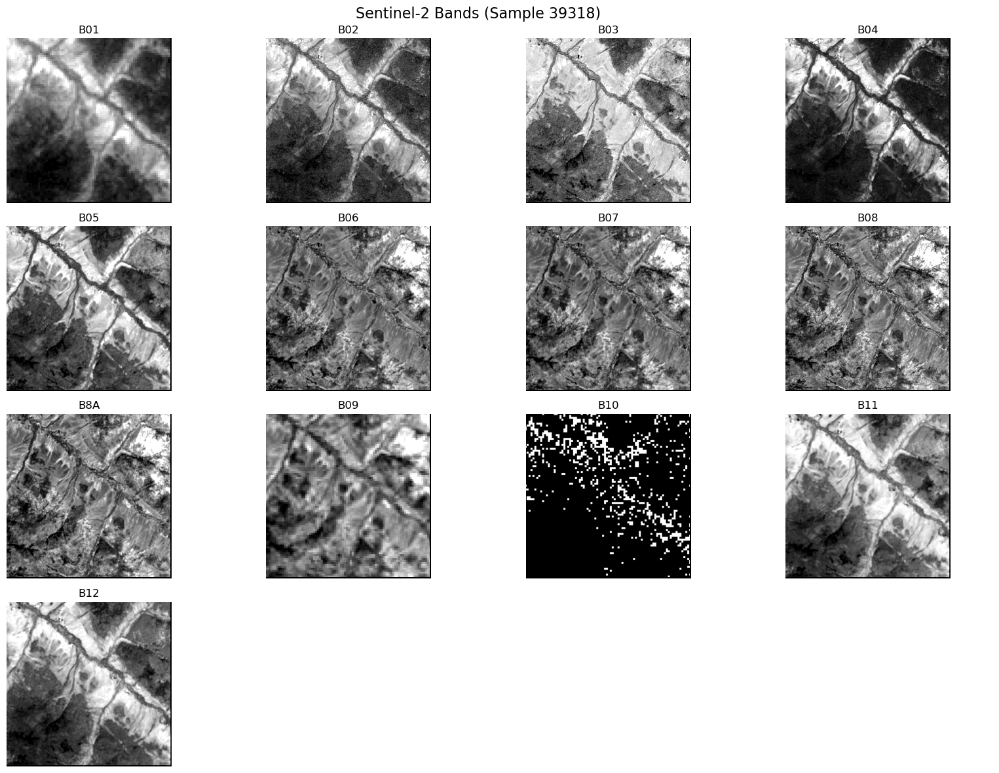

In [32]:
# Display all available bands (grayscale)
n_bands = len(bands)
cols = 4
rows = int(np.ceil(n_bands / cols))
fig, axes = plt.subplots(rows, cols, figsize=(16, 12))
axes = axes.flatten()

for i, (band_name, data) in enumerate(bands.items()):
    ax = axes[i]
    ax.imshow(data, cmap='gray', vmin=np.percentile(data, 2), vmax=np.percentile(data, 98))
    ax.set_title(band_name)
    ax.axis('off')

# hide empty subplots
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.suptitle(f"Sentinel-2 Bands (Sample {sample_idx})", fontsize=16)
plt.tight_layout()
plt.show()


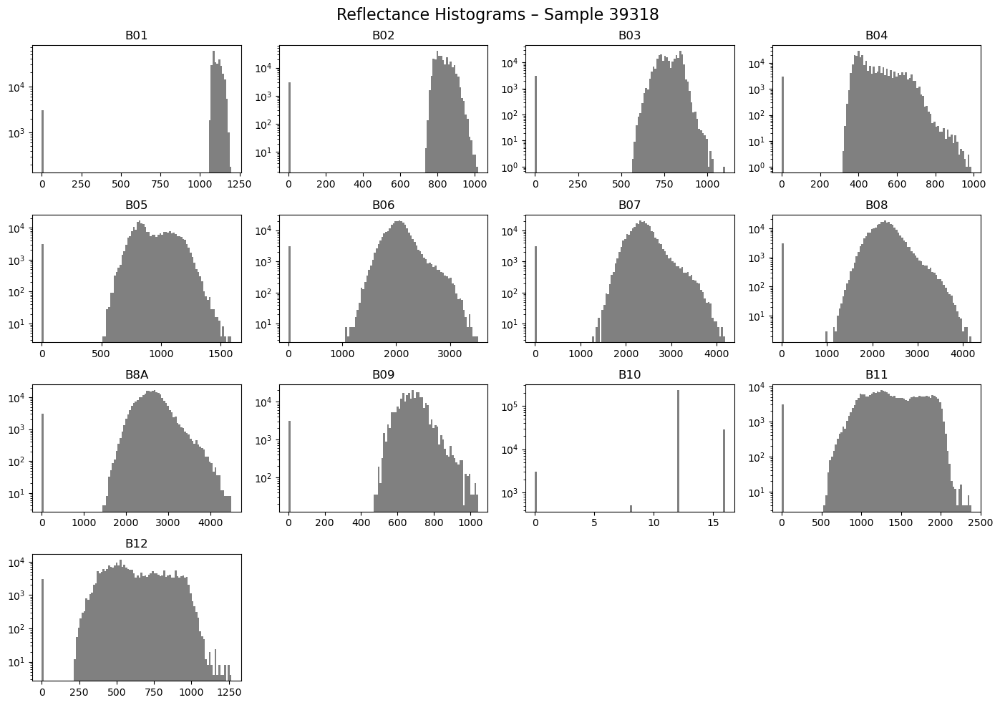

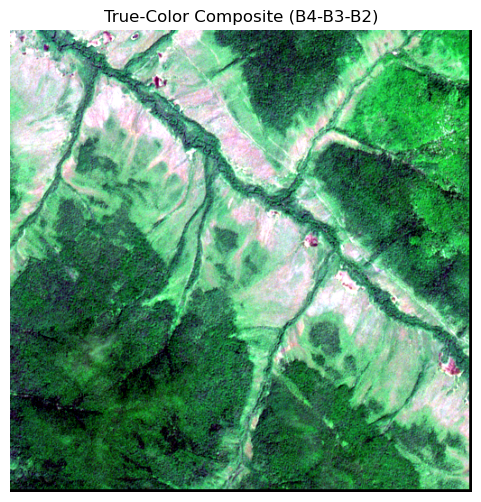

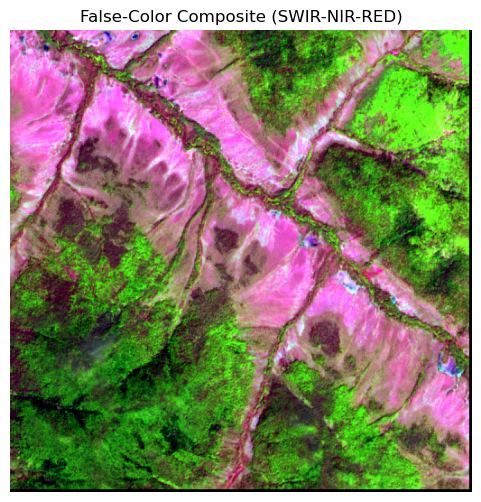

In [33]:
# Stack all bands for histogram/correlation analysis
band_names = list(bands.keys())
stack = np.stack([bands[b] for b in band_names], axis=-1).astype(float)

# Compute histogram per band
fig, axes = plt.subplots(4, 4, figsize=(14, 10))
axes = axes.flatten()
for i, b in enumerate(band_names[:len(axes)]):
    ax = axes[i]
    vals = bands[b].ravel()
    ax.hist(vals, bins=100, color='gray')
    ax.set_title(b)
    ax.set_yscale('log')
for j in range(i+1, len(axes)):
    axes[j].axis('off')
plt.suptitle(f"Reflectance Histograms – Sample {sample_idx}", fontsize=16)
plt.tight_layout()
plt.show()

# Simple RGB and False-color composites
def stretch(x): return np.clip((x - np.percentile(x, 2)) / (np.percentile(x, 98) - np.percentile(x, 2)), 0, 1)

if {'B04','B03','B02'}.issubset(bands):
    rgb = np.dstack([stretch(bands['B04']), stretch(bands['B03']), stretch(bands['B02'])])
    plt.figure(figsize=(6,6))
    plt.imshow(rgb)
    plt.title("True-Color Composite (B4-B3-B2)")
    plt.axis('off')
    plt.show()

if {'B12','B08','B04'}.issubset(bands):
    fc = np.dstack([stretch(bands['B12']), stretch(bands['B08']), stretch(bands['B04'])])
    plt.figure(figsize=(6,6))
    plt.imshow(fc)
    plt.title("False-Color Composite (SWIR-NIR-RED)")
    plt.axis('off')
    plt.show()


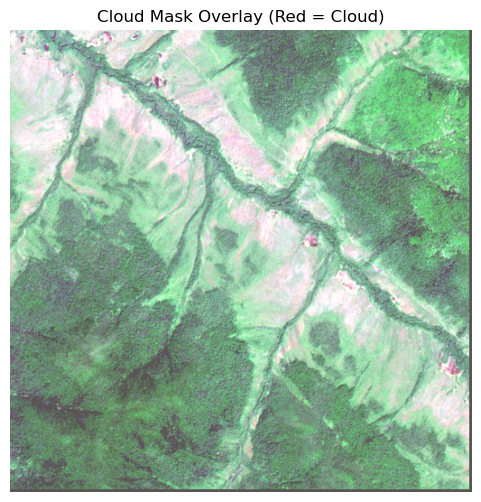

In [34]:
mask_row = sample[sample["tortilla:id"] == "target"].iloc[0]
with rio.open(mask_row["internal:subfile"]) as m:
    mask = m.read(1)

plt.figure(figsize=(6,6))
plt.imshow(rgb)
plt.imshow(mask, cmap="Reds", alpha=0.35)
plt.title("Cloud Mask Overlay (Red = Cloud)")
plt.axis("off")
plt.show()

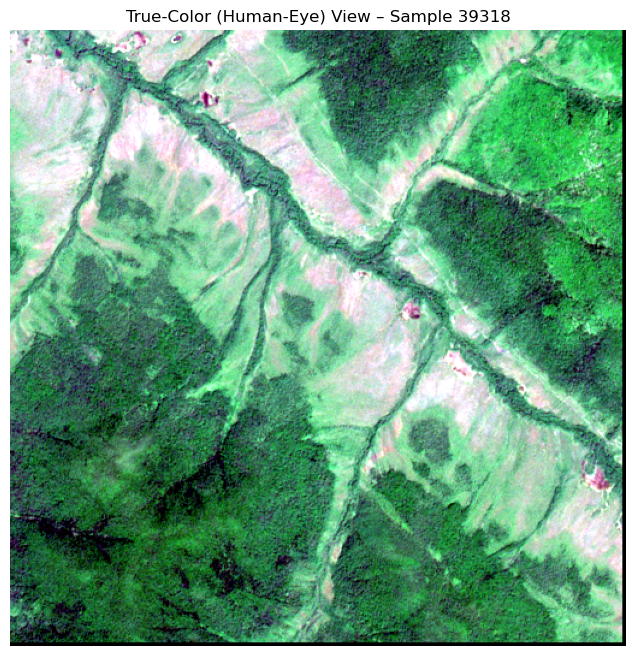

In [36]:
import numpy as np
import rasterio as rio
import matplotlib.pyplot as plt

# Pick one of your sample indices
sample_idx = int(sample_indices[2])
sample = dataset.read(sample_idx)

# Locate the Sentinel-2 image asset
img_row = sample[sample["tortilla:id"] == "s2l1c"].iloc[0]

# Helper: contrast stretch + gamma correction
def normalize(img, clip_percent=2, gamma=1.2):
    p_low, p_high = np.percentile(img, (clip_percent, 100 - clip_percent))
    img = np.clip((img - p_low) / (p_high - p_low), 0, 1)
    return np.power(img, 1 / gamma)

# Read true-color bands (B4=Red, B3=Green, B2=Blue)
with rio.open(img_row["internal:subfile"]) as src:
    try:
        red   = src.read(4).astype(float)
        green = src.read(3).astype(float)
        blue  = src.read(2).astype(float)
    except Exception:
        print("Cannot read all RGB bands from this asset.")

# Apply normalization and gamma to make it look natural
rgb = np.dstack([normalize(red), normalize(green), normalize(blue)])

# Display
plt.figure(figsize=(8, 8))
plt.imshow(rgb)
plt.title(f"True-Color (Human-Eye) View – Sample {sample_idx}")
plt.axis("off")
plt.show()


# 3. Qualitative EDA - 10 Samples

## A. Class distribution & cloud coverage histogram

Duplicate columns found: ['cloud_shadow_percentage']


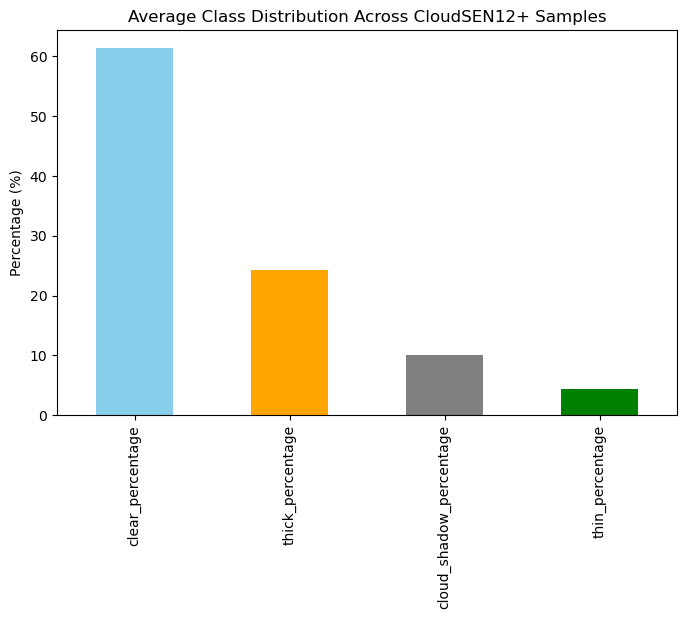

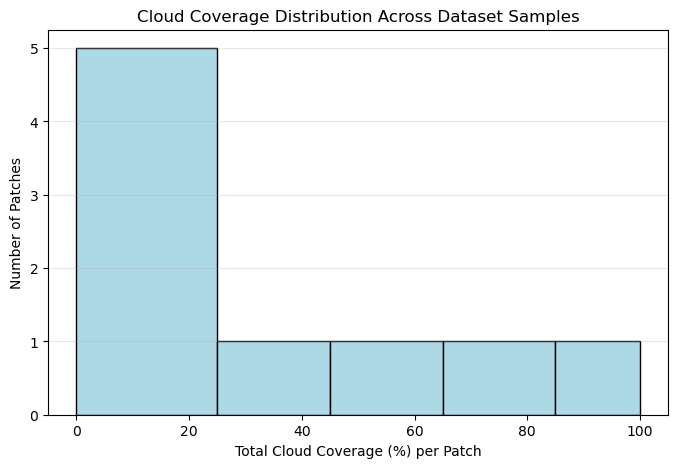

In [39]:
import pandas as pd
import matplotlib.pyplot as plt

# --- 1. Clean duplicate column names ---
# Identify duplicates
duplicates = meta_full_df.columns[meta_full_df.columns.duplicated()].unique()
if len(duplicates) > 0:
    print("Duplicate columns found:", duplicates.tolist())
    # Keep only the first occurrence of each duplicate
    meta_full_df = meta_full_df.loc[:, ~meta_full_df.columns.duplicated()]

# --- 2. Ensure numeric columns are truly numeric ---
for col in ["thin_percentage", "thick_percentage", "cloud_shadow_percentage"]:
    meta_full_df[col] = pd.to_numeric(meta_full_df[col], errors="coerce")

# --- 3. Compute total and clear cloud percentages ---
meta_full_df["total_cloud_pct"] = (
    meta_full_df["thin_percentage"].fillna(0)
    + meta_full_df["thick_percentage"].fillna(0)
    + meta_full_df["cloud_shadow_percentage"].fillna(0)
)
meta_full_df["clear_percentage"] = 100 - meta_full_df["total_cloud_pct"]

# --- 4. Class distribution plot ---
class_means = (
    meta_full_df[["thin_percentage", "thick_percentage", "cloud_shadow_percentage", "clear_percentage"]]
    .mean()
    .sort_values(ascending=False)
)

class_means.plot.bar(
    color=["skyblue", "orange", "gray", "green"],
    title="Average Class Distribution Across CloudSEN12+ Samples",
    ylabel="Percentage (%)",
    figsize=(8,5)
)
plt.show()

# --- 5. Cloud coverage histogram ---
plt.figure(figsize=(8,5))
plt.hist(meta_full_df["total_cloud_pct"], bins=[0,25,45,65,85,100],
         color="lightblue", edgecolor="black")
plt.xlabel("Total Cloud Coverage (%) per Patch")
plt.ylabel("Number of Patches")
plt.title("Cloud Coverage Distribution Across Dataset Samples")
plt.grid(axis='y', alpha=0.3)
plt.show()

## B. Spectral–label correlation 

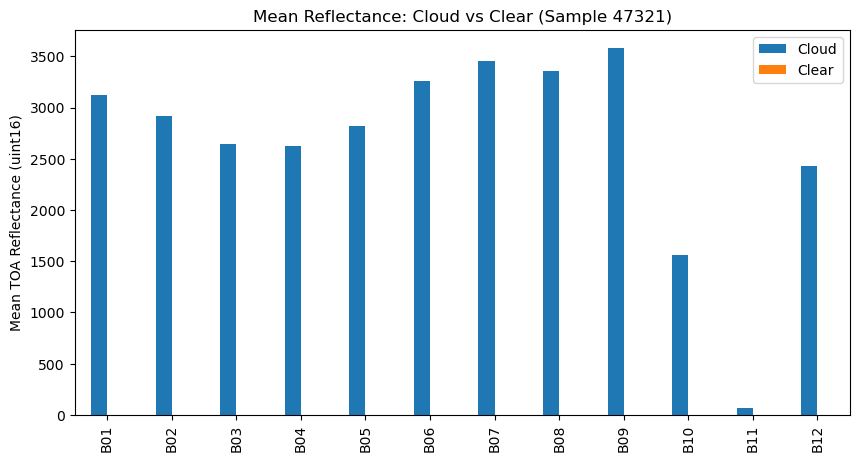

In [38]:
import numpy as np
import rasterio as rio

# pick one sample
sample_idx = int(sample_indices[0])
sample = dataset.read(sample_idx)
mask_row = sample[sample["tortilla:id"] == "target"].iloc[0]
img_row  = sample[sample["tortilla:id"] == "s2l1c"].iloc[0]

with rio.open(mask_row["internal:subfile"]) as m:
    mask = m.read(1).astype(bool)

with rio.open(img_row["internal:subfile"]) as src:
    bands = {f"B{i:02d}": src.read(i).astype(float) for i in range(1, 13)}

# mean reflectance by class (cloud vs clear)
means_cloud = {b: np.mean(bands[b][mask]) for b in bands}
means_clear = {b: np.mean(bands[b][~mask]) for b in bands}

df_corr = pd.DataFrame({"Cloud": means_cloud, "Clear": means_clear})
df_corr.plot.bar(title=f"Mean Reflectance: Cloud vs Clear (Sample {sample_idx})", figsize=(10,5))
plt.ylabel("Mean TOA Reflectance (uint16)")
plt.show()


C:\Users\nitin\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


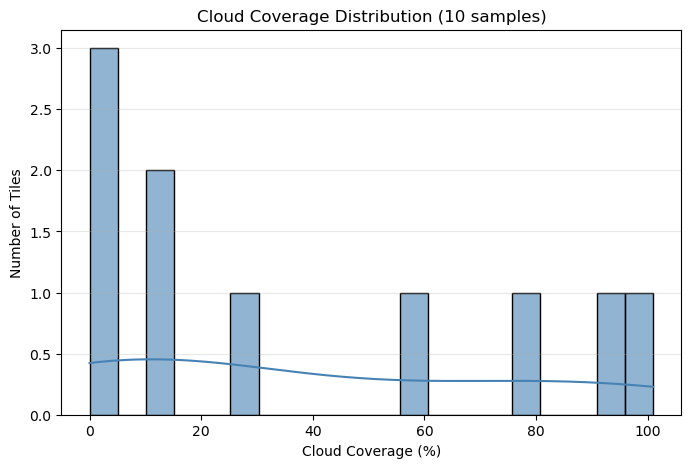

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Make sure your DataFrame has total_cloud_pct column
# If not, compute it again safely
if "total_cloud_pct" not in meta_full_df.columns:
    meta_full_df["total_cloud_pct"] = (
        meta_full_df["thin_percentage"].astype(float).fillna(0)
        + meta_full_df["thick_percentage"].astype(float).fillna(0)
        + meta_full_df["cloud_shadow_percentage"].astype(float).fillna(0)
    )

# Optional: random subset for visualization
subset = meta_full_df.sample(min(50, len(meta_full_df)), random_state=42)

plt.figure(figsize=(8,5))
sns.histplot(
    subset["total_cloud_pct"],
    bins=20, kde=True,
    color="steelblue", edgecolor="black", alpha=0.6
)
plt.title(f"Cloud Coverage Distribution ({len(subset)} samples)")
plt.xlabel("Cloud Coverage (%)")
plt.ylabel("Number of Tiles")
plt.grid(axis="y", alpha=0.3)
plt.show()


# 4. Statistical EDA - 800 Samples

## Batch-wise statistical sampling and aggregation

In [42]:
import numpy as np
import pandas as pd
import random
from tqdm import tqdm

# Number of random tiles to use for statistical EDA
N_SAMPLES = 800  # 500–1000 is ideal for your hardware

# Randomly select sample indices
random.seed(42)
indices = random.sample(range(len(dataset)), N_SAMPLES)

records = []

# Function to safely extract minimal metadata
def safe_extract_metadata(ds, idx):
    try:
        s = ds.read(idx)
        # pull dataset-level attributes if available
        rec = {
            "idx": idx,
            "roi_id": getattr(ds, "roi_id", [None])[idx],
            "label_type": getattr(ds, "label_type", [None])[idx],
            "thin_percentage": float(getattr(ds, "thin_percentage", [0])[idx]),
            "thick_percentage": float(getattr(ds, "thick_percentage", [0])[idx]),
            "cloud_shadow_percentage": float(getattr(ds, "cloud_shadow_percentage", [0])[idx]),
            "s2_mean_solar_zenith_angle": float(getattr(ds, "s2_mean_solar_zenith_angle", [np.nan])[idx]),
            "s2_mean_solar_azimuth_angle": float(getattr(ds, "s2_mean_solar_azimuth_angle", [np.nan])[idx])
        }
        return rec
    except Exception:
        return None

for idx in tqdm(indices, desc="Sampling CloudSEN12+ metadata"):
    rec = safe_extract_metadata(dataset, idx)
    if rec:
        records.append(rec)

df_stats = pd.DataFrame(records)

# compute total and clear sky percentages
df_stats["total_cloud_pct"] = (
    df_stats["thin_percentage"]
    + df_stats["thick_percentage"]
    + df_stats["cloud_shadow_percentage"]
)
df_stats["clear_percentage"] = 100 - df_stats["total_cloud_pct"]

print(f"\nCollected {len(df_stats)} samples for statistical EDA.")
df_stats.head()

Sampling CloudSEN12+ metadata: 100%|██████████| 800/800 [23:14<00:00,  1.74s/it]


Collected 800 samples for statistical EDA.


,idx,roi_id,label_type,thin_percentage,thick_percentage,cloud_shadow_percentage,s2_mean_solar_zenith_angle,s2_mean_solar_azimuth_angle,total_cloud_pct,clear_percentage
0,41905,ROI_07943,high,10.0,0.0,0.0,50.016273,147.004945,10.0,90.0
1,7296,ROI_06981,nolabel,5.0,13.0,4.0,29.659696,164.170485,22.0,78.0
2,1639,ROI_07414,nolabel,6.0,4.0,11.0,69.932970,64.711255,21.0,79.0
3,48598,ROI_00153,high,50.0,4.0,0.0,31.125637,29.826575,54.0,46.0
4,18024,ROI_11537,nolabel,0.0,0.0,0.0,47.232950,176.945309,0.0,100.0


In [45]:
df_stats.to_csv("statistical_metadata_800.csv", index=False)

In [ ]:
#df_stats = pd.read_csv("statistical_metadata_800.csv")


## A. Class distribution & cloud coverage histogram

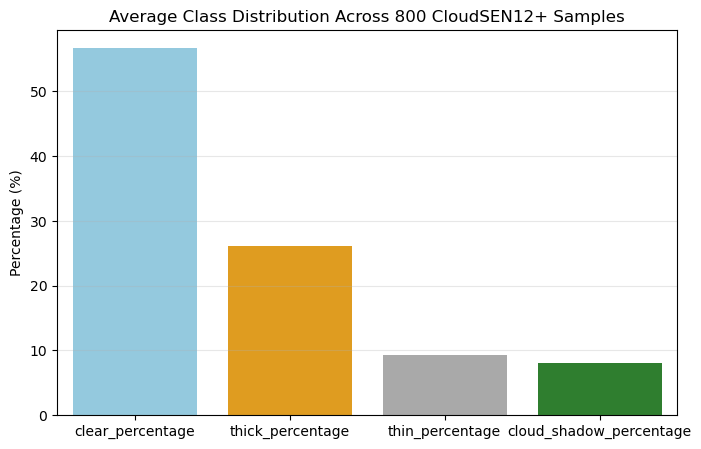

C:\Users\nitin\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


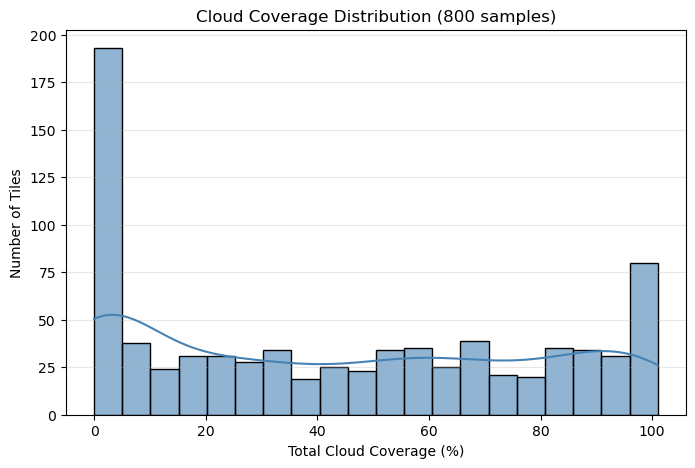

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- Class distribution bar plot ---
class_means = (
    df_stats[["thin_percentage","thick_percentage",
              "cloud_shadow_percentage","clear_percentage"]]
    .mean()
    .sort_values(ascending=False)
)

plt.figure(figsize=(8,5))
sns.barplot(x=class_means.index, y=class_means.values,
            palette=["#87CEEB","#FFA500","#A9A9A9","#228B22"])
plt.title(f"Average Class Distribution Across {len(df_stats)} CloudSEN12+ Samples")
plt.ylabel("Percentage (%)")
plt.xlabel("")
plt.grid(axis="y", alpha=0.3)
plt.show()

# --- Cloud coverage histogram + KDE ---
plt.figure(figsize=(8,5))
sns.histplot(df_stats["total_cloud_pct"], bins=20, kde=True,
             color="steelblue", edgecolor="black", alpha=0.6)
plt.title(f"Cloud Coverage Distribution ({len(df_stats)} samples)")
plt.xlabel("Total Cloud Coverage (%)")
plt.ylabel("Number of Tiles")
plt.grid(axis="y", alpha=0.3)
plt.show()

## B. Spectral–label correlation 

Spectral correlation subset:  10%|█         | 1/10 [00:03<00:29,  3.33s/it]C:\Users\nitin\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\nitin\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
Spectral correlation subset:  20%|██        | 2/10 [00:07<00:31,  3.94s/it]C:\Users\nitin\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\nitin\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
Spectral correlation subset: 100%|██████████| 10/10 [00:34<00:00,  3.46s/it]


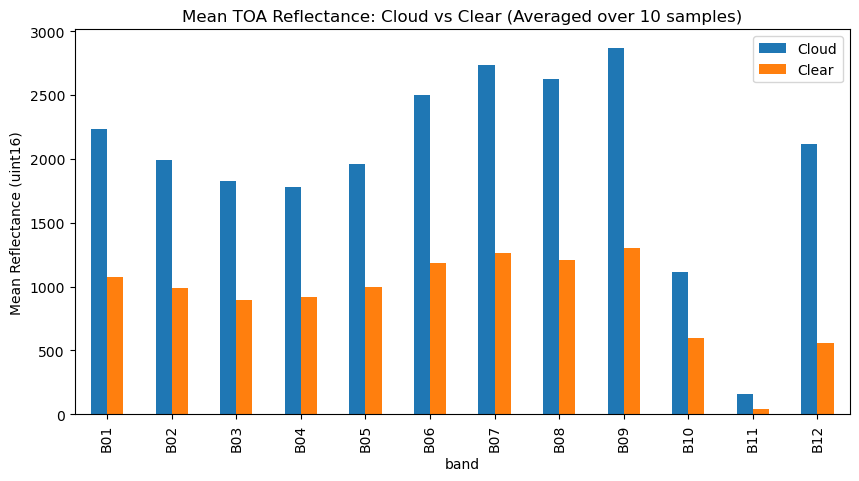

In [47]:
import rasterio as rio
import numpy as np
import random
import matplotlib.pyplot as plt
import pandas as pd

subset_for_spectral = random.sample(indices, 10)  # ~10 tiles for efficiency
spectral_records = []

for idx in tqdm(subset_for_spectral, desc="Spectral correlation subset"):
    try:
        s = dataset.read(idx)
        mask_row = s[s["tortilla:id"] == "target"].iloc[0]
        img_row  = s[s["tortilla:id"] == "s2l1c"].iloc[0]

        with rio.open(mask_row["internal:subfile"]) as m:
            mask = m.read(1).astype(bool)
        with rio.open(img_row["internal:subfile"]) as src:
            for i in range(1, 13):
                band = src.read(i).astype(float)
                mean_cloud = np.mean(band[mask])
                mean_clear = np.mean(band[~mask])
                spectral_records.append({
                    "sample": idx, "band": f"B{i:02d}",
                    "Cloud": mean_cloud, "Clear": mean_clear
                })
    except Exception:
        continue

df_spectral = pd.DataFrame(spectral_records)
df_spectral = df_spectral.groupby("band")[["Cloud","Clear"]].mean().reset_index()

df_spectral.plot.bar(x="band", title="Mean TOA Reflectance: Cloud vs Clear (Averaged over 10 samples)",
                     figsize=(10,5))
plt.ylabel("Mean Reflectance (uint16)")
plt.show()
